# SWB analysis pipeline part 2: 

- aggregate CPE epoch power data + metadata + roi locs 
- make dataframes for trial averaged regressions for hfa + beta 
- format time-resolved tfr data for TFR x condition plots 
- concat tfr ROI data across subjects 


*Created: 04/08/24* \
*Updated: 05/16/2024*


In [1]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp, pearsonr, spearmanr
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import os 
import joblib
import re
import datetime
import scipy
import random
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.regression.mixed_linear_model import MixedLM
import pickle

import warnings
warnings.filterwarnings('ignore')


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.append('/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/LFPAnalysis/')

In [4]:
from LFPAnalysis import lfp_preprocess_utils, sync_utils, analysis_utils, nlx_utils

In [5]:
# Specify root directory for un-archived data and results 
base_dir      = '/sc/arion/projects/guLab/Alie/SWB/'
anat_dir      = f'{base_dir}ephys_analysis/recon_labels/'
neural_dir    = f'{base_dir}ephys_analysis/data/'
behav_dir     = f'{base_dir}swb_behav_models/data/behavior_preprocessed/'
save_dir      = f'{base_dir}ephys_analysis/results/'
subj_info_dir = f'{base_dir}ephys_analysis/subj_info/'

date = datetime.date.today().strftime('%m%d%Y')
print(date)

05172024


In [6]:
# Subj list for CCN 2024
subj_ids = list(pd.read_excel(f'{subj_info_dir}SWB_subjects.xlsx', sheet_name='Usable_Subjects', usecols=[0]).PatientID)
n_subj = len(subj_ids)
subj_ids



['MS002',
 'MS003',
 'MS009',
 'MS011',
 'MS015',
 'MS016',
 'MS017',
 'MS019',
 'MS022',
 'MS024',
 'MS025',
 'MS026',
 'MS027',
 'MS028',
 'MS029',
 'MS030',
 'MS033',
 'MS035',
 'MS041',
 'MS043']

In [ ]:
# all_subj_power = {}
# all_subj_metadata  = {}


# # load pow epochs data 
# for subj_id in subj_ids: 
    
#     # load cpe power epochs for single subject 
#     power_epochs = mne.time_frequency.read_tfrs(f'{neural_dir}{subj_id}/{subj_id}_CpeOnset-tfr.h5')[0]
#     # save epochs metatdata with noise/IED info and behav regressors (NOT ZSCORED)
#     power_metadata = power_epochs.metadata
#     all_subj_metadata[subj_id] = power_metadata
#     # convert mne power data to data frame
#     power_df = power_epochs.to_data_frame()
#     del power_epochs # remove power epochs from memory to speed up loop
#     subj_band_dfs = {}
#     # extract power df with mean freq-specific power for each epoch for each elec 
#     for band,freq_range in analysis_freqs.items():
#         band_df = power_df[(power_df.freq >= freq_range[0])&(power_df.freq <= freq_range[1])].groupby(['epoch']).agg('mean').reset_index()
#         band_df['band'] = band
#         subj_band_dfs[band] = band_df 
#     del power_df # delete full power df to save memory
#     all_subj_power[subj_id] = subj_band_dfs
    
# # # create a binary pickle file 
# pickle.dump(all_subj_power,
#             open(f'{save_dir}all_subj_power_{("_").join(list(analysis_freqs.keys()))}_{date}.pkl',"wb"))

# # # create a binary pickle file 
# pickle.dump(all_subj_metadata,
#             open(f'{save_dir}all_subj_metadata_{date}.pkl',"wb")) 

In [7]:
##### MAKE SURE THIS IS NON ZSCORED METADATA OTHERWISE THIS WILL BE WRONG FOR TFR CONTRASTS!!!
# load newest file
metadata_paths = glob(f'{save_dir}all_subj_metadata_*.pkl')
load_date = str(np.max([int(path.split('_')[-1][:-4]) # find most recent saved df to load 
                        for path in metadata_paths]))

all_subj_metadata = pickle.load(open(f'{save_dir}all_subj_metadata_0{load_date}.pkl','rb'))
all_subj_metadata

{'MS002':     Round        RT     CpeOnset GambleChoice TrialType  SafeBet  LowBet  \
 0       1  2.059852   517.450091         safe       mix      0.0   -1.10   
 1       2  1.954564   526.596127       gamble      loss     -0.3   -0.95   
 2       3  1.583462   534.759061       gamble      gain      0.4    0.00   
 3       4  2.491611   550.084966         safe       mix      0.0   -0.80   
 4       5  1.768936   559.114656       gamble      gain      0.5    0.00   
 ..    ...       ...          ...          ...       ...      ...     ...   
 144   146  4.525226  2089.254288       gamble      loss     -0.5   -1.24   
 145   147  2.020671  2098.700082         safe       mix      0.0   -0.30   
 146   148  2.724080  2112.494308       gamble      loss     -0.5   -1.40   
 147   149  1.595996  2120.940681       gamble      gain      0.3    0.00   
 148   150  1.854358  2130.152942         safe       mix      0.0   -1.10   
 
      HighBet  GambleEV Outcome  Profit  TotalProfit   CR  choice

In [8]:
roi_reref_paths = glob(f'{subj_info_dir}roi_reref_labels_master_*.csv')
load_date = str(np.max([int(path.split('_')[-1][:-4]) # find most recent saved df to load 
                        for path in roi_reref_paths]))

roi_reref_labels_master = pd.read_csv(f'{subj_info_dir}roi_reref_labels_master_0{load_date}.csv')
roi_reref_labels_master = roi_reref_labels_master.drop(columns=['Unnamed: 0'])
roi_reref_labels_master

,subj_id,reref_ch_names,ch_label4roi,ch_type4roi,loc4roi,mni_x,mni_y,mni_z,hemi,roi
0,MS002,lacas1-lacas2,lacas1,anode,left cingulate gyrus d,-6.382462,37.158688,-3.130044,l,acc
1,MS002,lacas2-lacas3,lacas2,anode,left cingulate gyrus e,-6.368174,38.606223,2.270621,l,acc
2,MS002,lacas3-lacas4,lacas3,anode,left cingulate gyrus f,-6.390079,39.941566,7.640265,l,acc
3,MS002,lacas4-lacas5,lacas4,anode,left cingulate gyrus f,-6.914519,41.546899,12.993427,l,acc
4,MS002,lacas5-lacas6,lacas5,anode,left cingulate gyrus g,-6.933604,42.745784,18.267675,l,acc
...,...,...,...,...,...,...,...,...,...,...
1532,MS043,rmolf2-rmolf3,rmolf2,anode,right frontal orbital 4 a,8.730745,39.472355,-23.976517,r,ofc
1533,MS043,rmolf5-rmolf6,rmolf5,anode,right frontal orbital 3 c,22.205856,39.440201,-13.584725,r,ofc
1534,MS043,rmolf6-rmolf7,rmolf6,anode,right frontal orbital 3 d,26.714009,39.605555,-11.039552,r,ofc
1535,MS043,rmolf7-rmolf8,rmolf7,anode,right frontal orbital 3 d,30.860428,39.491140,-8.050810,r,ofc


In [14]:
load_date

'5142024'

## Define ROIs + Conditions of Interest 

### Label all condition types 

In [9]:
conditions =    [# Regret vs Relief
                ['(data.decisionCPE<0)','(data.decisionCPE>0)'], 
                 # Gamble Choice vs Safe Choice
                ['(data.GambleChoice=="gamble")','(data.GambleChoice=="safe")'],
                 # Loss vs Mix vs Gain
                ['(data.TrialType=="loss")','(data.TrialType=="mix")','(data.TrialType=="gain")'],
                # CPE for gamble trials
                ['(data.decisionCPE<0) & (data.GambleChoice=="gamble")','(data.decisionCPE>0) & (data.GambleChoice=="gamble")'],
                # CPE for safe trials 
                ['(data.decisionCPE<0) & (data.GambleChoice=="safe")','(data.decisionCPE>0) & (data.GambleChoice=="safe")'],
                # CPE for gamble + loss trials
                ['(data.decisionCPE<0) & (data.GambleChoice=="gamble") & (data.TrialType=="loss")',
                 '(data.decisionCPE>0) & (data.GambleChoice=="gamble") & (data.TrialType=="loss")'],
                # CPE for safe + loss trials 
                ['(data.decisionCPE<0) & (data.GambleChoice=="safe") & (data.TrialType=="loss")',
                 '(data.decisionCPE>0) & (data.GambleChoice=="safe") & (data.TrialType=="loss")'],
                # CPE for gamble + mix trials 
                ['(data.decisionCPE<0) & (data.GambleChoice=="gamble") & (data.TrialType=="mix")',
                 '(data.decisionCPE>0) & (data.GambleChoice=="gamble") & (data.TrialType=="mix")'],
                # CPE for safe + mix trials 
                ['(data.decisionCPE<0) & (data.GambleChoice=="safe") & (data.TrialType=="mix")',
                 '(data.decisionCPE>0) & (data.GambleChoice=="safe") & (data.TrialType=="mix")'],
                # CPE for gamble + gain trials
                ['(data.decisionCPE<0) & (data.GambleChoice=="gamble") & (data.TrialType=="gain")',
                 '(data.decisionCPE>0) & (data.GambleChoice=="gamble") & (data.TrialType=="gain")'],
                # CPE for safe + gain trials 
                ['(data.decisionCPE<0) & (data.GambleChoice=="safe") & (data.TrialType=="gain")',
                 '(data.decisionCPE>0) & (data.GambleChoice=="safe") & (data.TrialType=="gain")'] ]

In [10]:
cond_ids = ['CPE','Choice','TrialType','CPE_Gamble','CPE_Safe','CPE_Gamble_Loss','CPE_Safe_Loss',
            'CPE_Gamble_Mix','CPE_Safe_Mix','CPE_Gamble_Gain','CPE_Safe_Gain']

condition_master_key = []
list(zip(cond_ids,conditions))


In [112]:
condition_master_key = {}
# condition_master_key.keys() = cond_ids
for c_ix, c_name in enumerate(cond_ids):
    condition_master_key[c_name] = conditions[c_ix]

In [113]:
condition_master_key

{'CPE': ['(data.decisionCPE<0)', '(data.decisionCPE>0)'],
 'Choice': ['(data.GambleChoice=="gamble")', '(data.GambleChoice=="safe")'],
 'TrialType': ['(data.TrialType=="loss")',
  '(data.TrialType=="mix")',
  '(data.TrialType=="gain")'],
 'CPE_Gamble': ['(data.decisionCPE<0) & (data.GambleChoice=="gamble")',
  '(data.decisionCPE>0) & (data.GambleChoice=="gamble")'],
 'CPE_Safe': ['(data.decisionCPE<0) & (data.GambleChoice=="safe")',
  '(data.decisionCPE>0) & (data.GambleChoice=="safe")'],
 'CPE_Gamble_Loss': ['(data.decisionCPE<0) & (data.GambleChoice=="gamble") & (data.TrialType=="loss")',
  '(data.decisionCPE>0) & (data.GambleChoice=="gamble") & (data.TrialType=="loss")'],
 'CPE_Safe_Loss': ['(data.decisionCPE<0) & (data.GambleChoice=="safe") & (data.TrialType=="loss")',
  '(data.decisionCPE>0) & (data.GambleChoice=="safe") & (data.TrialType=="loss")'],
 'CPE_Gamble_Mix': ['(data.decisionCPE<0) & (data.GambleChoice=="gamble") & (data.TrialType=="mix")',
  '(data.decisionCPE>0) & (dat

### Find metadata indexes for each condition

In [11]:
cond_idx_by_subj = {}

for subj_id in subj_ids:
    data = all_subj_metadata[subj_id]
    condition_idx_info = {}
    for idx,cond_group in enumerate(conditions):
        cond_group_dict = {}
        group_id = cond_ids[idx]
        for cond in cond_group:
            cond_idx = data[eval(cond)].index
            cond_group_dict[cond] = cond_idx
        condition_idx_info[group_id] = cond_group_dict
    cond_idx_by_subj[subj_id] = condition_idx_info

### Find Subj ROI Channels

In [12]:
##### define subset of ROIs to test 
rois = ['motor','dmpfc','dlpfc','vmpfc','vlpfc', 'ofc','acc', 'mcc','ains','pins','amy','hpc','thalamus']


In [13]:
roi_ch_by_subj = {}

for subj_id in subj_ids: 
    df = roi_reref_labels_master[roi_reref_labels_master.subj_id == subj_id]
    subj_roi_dict = {}
    for roi in rois: 
        subj_roi_dict[roi] = df.reref_ch_names[df.roi == roi].tolist()
    roi_ch_by_subj[subj_id] = subj_roi_dict
        


### Load power epochs for each subj, subset and mean data by cond for each ROI

NOTE - cond1/cond2 pow for trial types conditions leaves out gain trials! 

In [ ]:
all_subj_all_roi_all_cond = {}
times = [] # just need one vec - should be same for all subj 


for subj_id in subj_ids:
    
    subj_roi_cond_dict = {f'{a}': {f'{b}': [] for b in cond_ids} for a in rois}
    # load power epochs for single subject 
    power_epochs = mne.time_frequency.read_tfrs(f'{neural_dir}{subj_id}/{subj_id}_CpeOnset-tfr.h5')[0]
    times = power_epochs.times.copy()
    for roi in rois: 
        
        roi_ch_list = roi_ch_by_subj[subj_id][roi]
        roi_pow     = power_epochs.copy().pick_channels(roi_ch_list)._data
        
        for cond_group in subj_roi_cond_dict[roi].keys():
            
            cond_id_list = condition_master_key[cond_group]
            X = [] 
            
            for ix,cond in enumerate(cond_id_list):
                
                # subset cond index by subj info, into subject dict, into cond group dict, list keys, first idx 
                cond_epochs = cond_idx_by_subj[subj_id][cond_group][cond]
                # get pow data for each cond idx, then average on epoch & ch axis
                cond_pow = np.nanmean(np.nanmean(roi_pow[cond_epochs,:,:,:],axis=0),axis=0)
                X.append(cond_pow)
            
            subj_roi_cond_dict[roi][cond_group] = X

    all_subj_all_roi_all_cond[subj_id] = subj_roi_cond_dict
    del power_epochs, roi_pow, subj_roi_cond_dict


pickle.dump(times,open(f'{save_dir}cpe_epoch_times_{date}.pkl',"wb"))
pickle.dump(all_subj_all_roi_all_cond,open(f'{save_dir}all_subj_all_roi_all_cond_{date}.pkl',"wb"))

    

Reading /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS002/MS002_CpeOnset-tfr.h5 ...
Adding metadata with 19 columns
Reading /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS003/MS003_CpeOnset-tfr.h5 ...
Adding metadata with 19 columns
Reading /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS004/MS004_CpeOnset-tfr.h5 ...
Adding metadata with 19 columns
Reading /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS009/MS009_CpeOnset-tfr.h5 ...
Adding metadata with 19 columns
Reading /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS011/MS011_CpeOnset-tfr.h5 ...
Adding metadata with 19 columns
Reading /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS015/MS015_CpeOnset-tfr.h5 ...
Adding metadata with 19 columns
Reading /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS016/MS016_CpeOnset-tfr.h5 ...
Adding metadata with 19 columns
Reading /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS017/MS017_CpeOnset-tfr.h5 ...
Adding metadata with 19 

In [ ]:
# all_subj_all_roi_all_cond = {}
# times = [] # just need one vec - should be same for all subj 


# for subj_id in subj_ids:
    
#     subj_roi_cond_dict = {f'{a}': {f'{b}': [] for b in cond_ids} for a in rois}
#     # load power epochs for single subject 
#     power_epochs = mne.time_frequency.read_tfrs(f'{neural_dir}{subj_id}/{subj_id}_CpeOnset-tfr.h5')[0]
#     times = power_epochs.times
#     for roi in rois: 
#         roi_ch_list = roi_ch_by_subj[subj_id][roi]
#         roi_pow     = power_epochs.copy().pick_channels(roi_ch_list)._data
        
#         for cond_group in subj_roi_cond_dict[roi].keys():
#             # subjset cond index by subj info, into subject dict, into cond group dict, list keys, first idx 
#             cond1_idx = cond_idx_by_subj[subj_id][cond_group][list(cond_idx_by_subj[subj_id][cond_group].keys())[0]]
#             cond2_idx = cond_idx_by_subj[subj_id][cond_group][list(cond_idx_by_subj[subj_id][cond_group].keys())[1]]

#             # get pow data for each cond idx, then average on epoch & ch axis
#             cond1_pow = np.nanmean(np.nanmean(roi_pow[cond1_idx,:,:,:],axis=0),axis=0)
#             cond2_pow = np.nanmean(np.nanmean(roi_pow[cond2_idx,:,:,:],axis=0),axis=0)
#             X = [cond1_pow,cond2_pow]
#             subj_roi_cond_dict[roi][cond_group] = X

#     all_subj_all_roi_all_cond[subj_id] = subj_roi_cond_dict
#     del power_epochs, roi_pow, subj_roi_cond_dict


# pickle.dump(times,open(f'{save_dir}cpe_epoch_times_{date}.pkl',"wb"))
# pickle.dump(all_subj_all_roi_all_cond,open(f'{save_dir}all_subj_all_roi_all_cond_{date}.pkl',"wb"))

    

In [15]:
cond_paths = glob(f'{save_dir}all_subj_all_roi_all_cond_*.pkl')
load_date = str(np.max([int(path.split('_')[-1][:-4]) # find most recent saved df to load 
                        for path in cond_paths]))

all_subj_all_roi_all_cond = pickle.load(open(f'{save_dir}all_subj_all_roi_all_cond_0{load_date}.pkl',"rb"))
all_subj_all_roi_all_cond


times = pickle.load(open(f'{save_dir}cpe_epoch_times_05162024.pkl','rb'))
times

{'MS002': {'motor': {'CPE': [array([[-0.02384267, -0.02343108, -0.02300439, ...,  0.03082899,
             0.03017085,  0.02950479],
           [-0.05887887, -0.058771  , -0.05864657, ..., -0.01718326,
            -0.01795551, -0.01873365],
           [-0.10025932, -0.10017346, -0.10008074, ..., -0.08893952,
            -0.08989909, -0.09085643],
           ...,
           [ 0.02473982,  0.03229221,  0.04075177, ...,  0.00830319,
            -0.03144531, -0.03019115],
           [ 0.04125308,  0.05872133,  0.07491398, ..., -0.00949183,
             0.00598397,  0.01487586],
           [ 0.08511257,  0.08841268,  0.08879135, ...,  0.06389047,
             0.09142369,  0.1121232 ]]),
    array([[ 0.06923511,  0.07169834,  0.07419885, ..., -0.07576074,
            -0.07475915, -0.07376552],
           [ 0.04658733,  0.04819864,  0.04984864, ..., -0.11949362,
            -0.1182221 , -0.11696678],
           [ 0.02512459,  0.02615935,  0.02721851, ..., -0.14475752,
            -0.14405449,

# Single Subject TFR Contrasts

In [23]:
rois = ['motor','dmpfc','dlpfc','vmpfc','vlpfc', 'ofc','acc', 'mcc','ains','pins','amy','hpc','thalamus']


In [101]:
### Plot Regret/Relief Contrasts - All Subj All ROI

sns.set_context('poster')

freqs = np.logspace(*np.log10([2, 200]), num=30) # set frequencies 

tfr_cond_id = 'CPE' # corresponds to key in subjid>roi>conditions dict in all_subj_all_roi_all_cond


for subj_id in subj_ids:
    
    # make new tfr dir
    subj_tfr_roi_dir = f'{base_dir}ephys_analysis/figs/TFRs/{subj_id}/tfr_contrasts/{tfr_cond_id}/'
    os.makedirs(subj_tfr_roi_dir,exist_ok=True)
    
    # iterate through rois 
    for roi in rois:
         
        # get tfr plot data - should be list of 2 pow arrays for each cond 
        roi_tfr_data = all_subj_all_roi_all_cond[subj_id][roi][tfr_cond_id]
        # create empty plot with 2 subplots 
        fig, ax = plt.subplots(1, len(roi_tfr_data), figsize=(20, 6), dpi=300)

        # since there are only 2 conditions in each cond_id - can manually set axes

        #         vmax = np.max(np.array([np.max(roi_tfr_data[0]),np.max(roi_tfr_data[1])]))
        #         vmin = np.negative(vmax)
        vmax = 0.25
        vmin = -0.25

        im1 = ax[0].imshow(roi_tfr_data[0],interpolation='Bicubic',aspect='auto', origin='lower', 
                           cmap='RdBu_r',vmin = vmin, vmax = vmax)

        im2 = ax[1].imshow(roi_tfr_data[1],interpolation='Bicubic',aspect='auto', origin='lower', 
                   cmap='RdBu_r',vmin = vmin, vmax = vmax)

        ax[0].set(xlabel='Time (s)', ylabel='Frequency', title=f'{roi} Regret',
                  yticks=np.arange(0,len(freqs))[::5], 
                  yticklabels=freqs[::5].astype(int), 
                  xticks = np.arange(roi_tfr_data[0].shape[1])[::500],
                  xticklabels= times[::500])

        ax[1].set(xlabel='Time (s)', ylabel='Frequency', title=f'{roi} Relief',
                  yticks=np.arange(0,len(freqs))[::5], 
                  yticklabels=freqs[::5].astype(int), 
                  xticks = np.arange(roi_tfr_data[1].shape[1])[::500],
                  xticklabels= times[::500])

        fig.colorbar(im1, ax=ax[0])
        fig.colorbar(im2, ax=ax[1])


        plt.savefig(f'{subj_tfr_roi_dir}/{subj_id}_{roi}_{tfr_cond_id}_{date}.png', format='png', metadata=None,
        bbox_inches=None, pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None)
        plt.close()



In [27]:
### Plot Gamble/Safe Contrasts - All Subj All ROI

sns.set_context('poster')

freqs = np.logspace(*np.log10([2, 200]), num=30) # set frequencies 

tfr_cond_id = 'Choice' # corresponds to key in subjid>roi>conditions dict in all_subj_all_roi_all_cond


for subj_id in subj_ids:
    
    # make new tfr dir
    subj_tfr_roi_dir = f'{base_dir}ephys_analysis/figs/TFRs/{subj_id}/tfr_contrasts/{tfr_cond_id}/'
    os.makedirs(subj_tfr_roi_dir,exist_ok=True)
    
    # iterate through rois 
    for roi in rois:
         
        # get tfr plot data - should be list of 2 pow arrays for each cond 
        roi_tfr_data = all_subj_all_roi_all_cond[subj_id][roi][tfr_cond_id]
        # create empty plot with 2 subplots 
        fig, ax = plt.subplots(1, len(roi_tfr_data), figsize=(20, 6), dpi=300)

        # since there are only 2 conditions in each cond_id - can manually set axes

        #         vmax = np.max(np.array([np.max(roi_tfr_data[0]),np.max(roi_tfr_data[1])]))
        #         vmin = np.negative(vmax)
        vmax = 0.25
        vmin = -0.25

        im1 = ax[0].imshow(roi_tfr_data[0],interpolation='Bicubic',aspect='auto', origin='lower', 
                           cmap='RdBu_r',vmin = vmin, vmax = vmax)

        im2 = ax[1].imshow(roi_tfr_data[1],interpolation='Bicubic',aspect='auto', origin='lower', 
                   cmap='RdBu_r',vmin = vmin, vmax = vmax)

        ax[0].set(xlabel='Time (s)', ylabel='Frequency', title=f'{roi} Gamble Choice',
                  yticks=np.arange(0,len(freqs))[::5], 
                  yticklabels=freqs[::5].astype(int), 
                  xticks = np.arange(roi_tfr_data[0].shape[1])[::500],
                  xticklabels= times[::500])

        ax[1].set(xlabel='Time (s)', ylabel='Frequency', title=f'{roi} Safe Choice',
                  yticks=np.arange(0,len(freqs))[::5], 
                  yticklabels=freqs[::5].astype(int), 
                  xticks = np.arange(roi_tfr_data[1].shape[1])[::500],
                  xticklabels= times[::500])

        fig.colorbar(im1, ax=ax[0])
        fig.colorbar(im2, ax=ax[1])


        plt.savefig(f'{subj_tfr_roi_dir}/{subj_id}_{roi}_{tfr_cond_id}_{date}.png', format='png', metadata=None,
        bbox_inches=None, pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None)
        plt.close()



In [26]:
## Plot CPE + Choice - All Subj All ROI

sns.set_context('poster')

freqs = np.logspace(*np.log10([2, 200]), num=30) # set frequencies 


tfr_cond_idx = ['CPE_Gamble','CPE_Safe']
tfr_titles   = ['Gamble Regret','Gamble Relief','Safe Regret','Safe Relief']
tfr_cond_id  = 'CPE_Choice'

for subj_id in subj_ids:
    
    # make new tfr dir
    subj_tfr_roi_dir = f'{base_dir}ephys_analysis/figs/TFRs/{subj_id}/tfr_contrasts/{tfr_cond_id}/'
    os.makedirs(subj_tfr_roi_dir,exist_ok=True)
    
    # iterate through rois 
    for roi in rois:
         
        # get tfr plot data - should be list of 2 pow arrays for each cond 
        roi_tfr_data1 = all_subj_all_roi_all_cond[subj_id][roi][tfr_cond_idx[0]]
        roi_tfr_data2 = all_subj_all_roi_all_cond[subj_id][roi][tfr_cond_idx[1]]
        roi_tfr_data  = roi_tfr_data1 + roi_tfr_data2
        
        # create empty plot with 2 subplots 
        fig, ax = plt.subplots(2, 2, figsize=(30, 20), dpi=300)

        vmax = 0.25
        vmin = -0.25
        
        ax_pos = [(0,0),(0,1),(1,0),(1,1)]
        
        for idx,axi in enumerate(ax_pos): 
            
            im = ax[axi].imshow(roi_tfr_data[idx],interpolation='Bicubic',aspect='auto', origin='lower', 
                               cmap='RdBu_r',vmin = vmin, vmax = vmax)

            ax[axi].set(xlabel='Time (s)', ylabel='Frequency', title=f'{roi}{tfr_titles[idx]}',
                        yticks=np.arange(0,len(freqs))[::5], 
                        yticklabels=freqs[::5].astype(int), 
                        xticks = np.arange(roi_tfr_data[idx].shape[1])[::500],
                        xticklabels= times[::500])

            fig.colorbar(im, ax=ax[axi])



        plt.savefig(f'{subj_tfr_roi_dir}/{subj_id}_{roi}_{tfr_cond_id}_{date}.png', format='png', metadata=None,
        bbox_inches=None, pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None)
        plt.close()




IndexError: index 2 is out of bounds for axis 0 with size 2

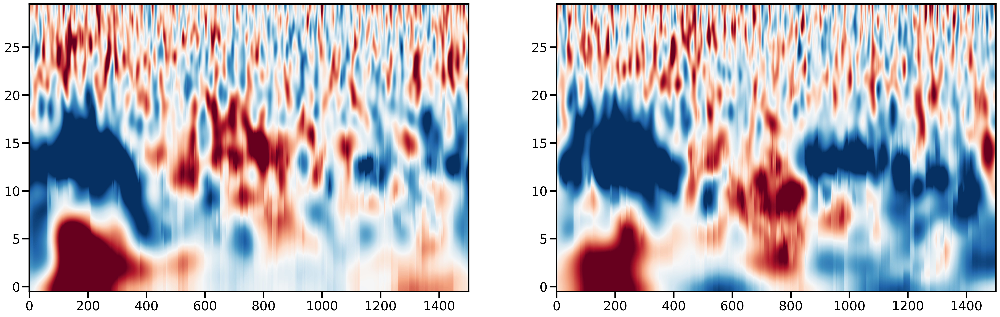

In [102]:
### Plot Trial Type Contrasts - All Subj All ROI

sns.set_context('poster')

freqs = np.logspace(*np.log10([2, 200]), num=30) # set frequencies 

tfr_cond_id = 'TrialType' # corresponds to key in subjid>roi>conditions dict in all_subj_all_roi_all_cond


for subj_id in subj_ids:
    
    # make new tfr dir
    tfr_roi_dir = f'{base_dir}ephys_analysis/figs/TFRs/{tfr_cond_id}/'
    os.makedirs(tfr_roi_dir,exist_ok=True)
    
    # iterate through rois 
    for roi in rois:
         
        # get tfr plot data - should be list of 2 pow arrays for each cond 
        roi_tfr_data = all_subj_all_roi_all_cond[subj_id][roi][tfr_cond_id]
        # create empty plot with 2 subplots 
        fig, ax = plt.subplots(1, len(roi_tfr_data), figsize=(30,9), dpi=300)

        vmax = 0.25
        vmin = -0.25

        im1 = ax[0].imshow(roi_tfr_data[0],interpolation='Bicubic',aspect='auto', origin='lower', 
                           cmap='RdBu_r',vmin = vmin, vmax = vmax)

        im2 = ax[1].imshow(roi_tfr_data[1],interpolation='Bicubic',aspect='auto', origin='lower', 
                   cmap='RdBu_r',vmin = vmin, vmax = vmax)
        
        im3 = ax[2].imshow(roi_tfr_data[2],interpolation='Bicubic',aspect='auto', origin='lower', 
                   cmap='RdBu_r',vmin = vmin, vmax = vmax)

        ax[0].set(xlabel='Time (s)', ylabel='Frequency', title=f'{subj_id} {roi} Loss Trials',
                  yticks=np.arange(0,len(freqs))[::5], 
                  yticklabels=freqs[::5].astype(int), 
                  xticks = np.arange(roi_tfr_data[0].shape[1])[::500],
                  xticklabels= times[::500])

        ax[1].set(xlabel='Time (s)', ylabel='Frequency', title=f'{subj_id} {roi} Mix Trials',
                  yticks=np.arange(0,len(freqs))[::5], 
                  yticklabels=freqs[::5].astype(int), 
                  xticks = np.arange(roi_tfr_data[1].shape[1])[::500],
                  xticklabels= times[::500])
        
        ax[2].set(xlabel='Time (s)', ylabel='Frequency', title=f'{subj_id} {roi} Gain Trials',
                  yticks=np.arange(0,len(freqs))[::5], 
                  yticklabels=freqs[::5].astype(int), 
                  xticks = np.arange(roi_tfr_data[2].shape[1])[::500],
                  xticklabels= times[::500])

        fig.colorbar(im1, ax=ax[0])
        fig.colorbar(im2, ax=ax[1])
        fig.colorbar(im3, ax=ax[2])


        plt.savefig(f'{tfr_roi_dir}/{subj_id}_{roi}_{tfr_cond_id}_{date}.png', format='png', metadata=None,
        bbox_inches=None, pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None)
        plt.close()



In [103]:
roi_tfr_data

[array([[-0.03255122, -0.03067498, -0.02875336, ...,  0.02332868,
          0.02177245,  0.02020294],
        [-0.09248579, -0.09190285, -0.09127088, ...,  0.01746148,
          0.01553285,  0.01357788],
        [-0.1474096 , -0.14807143, -0.14870235, ..., -0.02923508,
         -0.03139937, -0.03358789],
        ...,
        [-0.04588929, -0.04304287, -0.03666931, ...,  0.18418634,
          0.08207979,  0.04033717],
        [-0.05984644, -0.04473049, -0.03563981, ..., -0.01745783,
         -0.02837039, -0.03506456],
        [ 0.17677568,  0.17826058,  0.1618399 , ...,  0.00880046,
          0.07424102,  0.14037217]]),
 array([[ 0.03167244,  0.03262091,  0.03358559, ..., -0.01825349,
         -0.01749154, -0.01673948],
        [ 0.04498734,  0.04618395,  0.04739582, ..., -0.13576156,
         -0.13489482, -0.13402486],
        [ 0.01636671,  0.0183756 ,  0.02040169, ..., -0.22842729,
         -0.22801276, -0.22758602],
        ...,
        [ 0.09051446,  0.07831667,  0.06596617, ..., -

# ROI TFRs Across Subjects 

In [34]:
rois = ['motor','dmpfc','dlpfc','vmpfc','vlpfc', 'ofc','acc', 'mcc','ains','pins','amy','hpc','thalamus']

roi_subjects = {f'{r}':[] for r in rois}

for subj_id in roi_ch_by_subj.keys():
    subj_roi_info = roi_ch_by_subj[subj_id]
    for roi in subj_roi_info.keys():
        if subj_roi_info[roi]:
            roi_subjects[roi].append(subj_id)
roi_subjects

{'motor': ['MS002',
  'MS003',
  'MS009',
  'MS011',
  'MS015',
  'MS016',
  'MS017',
  'MS022',
  'MS030'],
 'dmpfc': ['MS002',
  'MS003',
  'MS004',
  'MS009',
  'MS011',
  'MS015',
  'MS016',
  'MS017',
  'MS019',
  'MS022',
  'MS024',
  'MS025',
  'MS026',
  'MS027',
  'MS028',
  'MS029',
  'MS030',
  'MS033',
  'MS035',
  'MS041',
  'MS043'],
 'dlpfc': ['MS002',
  'MS003',
  'MS004',
  'MS009',
  'MS011',
  'MS015',
  'MS016',
  'MS017',
  'MS019',
  'MS022',
  'MS024',
  'MS025',
  'MS027',
  'MS028',
  'MS029',
  'MS030',
  'MS033',
  'MS035',
  'MS041',
  'MS043'],
 'vmpfc': ['MS003', 'MS017', 'MS019', 'MS025', 'MS029'],
 'vlpfc': ['MS002',
  'MS003',
  'MS004',
  'MS009',
  'MS011',
  'MS015',
  'MS016',
  'MS017',
  'MS019',
  'MS022',
  'MS024',
  'MS025',
  'MS026',
  'MS027',
  'MS028',
  'MS029',
  'MS030',
  'MS033',
  'MS035',
  'MS041',
  'MS043'],
 'ofc': ['MS002',
  'MS003',
  'MS004',
  'MS009',
  'MS011',
  'MS015',
  'MS016',
  'MS017',
  'MS019',
  'MS024',
  'MS

In [84]:
##### First step - concatenate all subjects contrast data + average 
# rois = ['motor','dmpfc','dlpfc','vmpfc','vlpfc', 'ofc','acc', 'mcc','ains','pins','amy','hpc','thalamus']

tfr_cond_idx = ['CPE_Gamble','CPE_Safe']

freqs = np.logspace(*np.log10([2, 200]), num=30) # set frequencies 

cpe_choice_roi_tfrs = {}
# cpe_gamble_roi_tfrs = {}
# cpe_safe_roi_tfrs = {}

for roi in rois:
    
    roi_subj_list = roi_subjects[roi]
    
    roi_dims = (len(freqs),len(times),len(roi_subj_list))
    
    # empty 3D array freqs x times x subj_ids
    regret_gamb_roi_tfrs = np.zeros(roi_dims) 
    relief_gamb_roi_tfrs = np.zeros(roi_dims) 
    
    regret_safe_roi_tfrs = np.zeros(roi_dims) 
    relief_safe_roi_tfrs = np.zeros(roi_dims) 
    
    
    for s_ix, subj_id in enumerate(roi_subj_list): 
        
        ### GAMBLE DATA 
                
        # get tfr plot data for each subj, each roi - should be list of 2 pow arrays for each cond 
        roi_tfr_data = all_subj_all_roi_all_cond[subj_id][roi][tfr_cond_idx[0]]
        # add subj tfr to roi tfrs separated by condition
        regret_gamb_roi_tfrs[:,:,s_ix] = roi_tfr_data[0] ##### REGRET
        # add subj tfr to roi tfrs separated by condition
        relief_gamb_roi_tfrs[:,:,s_ix] = roi_tfr_data[1] ##### RELIEF
        
        ##### SAFE DATA
                
        # get tfr plot data for each subj, each roi - should be list of 2 pow arrays for each cond 
        roi_tfr_data2 = all_subj_all_roi_all_cond[subj_id][roi][tfr_cond_idx[1]]
        # add subj regret_safe_roi_tfrs to roi tfrs separated by condition
        regret_safe_roi_tfrs[:,:,s_ix] = roi_tfr_data2[0] ##### REGRET
        # add subj tfr to roi tfrs separated by condition
        relief_safe_roi_tfrs[:,:,s_ix] = roi_tfr_data2[1] ##### RELIEF
        
        
    cpe_choice_roi_tfrs[roi] = {'Gamble + Regret':regret_gamb_roi_tfrs,
                                'Gamble + Relief':relief_gamb_roi_tfrs,
                                'Safe + Regret':regret_safe_roi_tfrs,
                                'Safe + Relief':relief_safe_roi_tfrs}
    
#     cpe_gamble_roi_tfrs[roi] = {'regret_gamble':regret_gamb_roi_tfrs,
#                                 'relief_gamble':relief_gamb_roi_tfrs}
                
#     cpe_safe_roi_tfrs[roi] = {'regret_safe':regret_safe_roi_tfrs,
#                                 'relief_safe':relief_safe_roi_tfrs}

    
    
        




In [100]:
##### Plot ROI cond plots averaged across subjects

# rois = ['motor','dmpfc','dlpfc','vmpfc','vlpfc', 'ofc','acc', 'mcc','ains','pins','amy','hpc','thalamus']

tfr_cond_idx = ['CPE_Gamble','CPE_Safe']
tfr_titles   = ['Gamble Regret','Gamble Relief','Safe Regret','Safe Relief']
tfr_cond_id  = 'CPE_Choice'

freqs = np.logspace(*np.log10([2, 200]), num=30) # set frequencies 

sns.set_context('poster')
    
# iterate through rois 
for roi in rois:
    # make new tfr dir
    tfr_roi_dir = f'{base_dir}ephys_analysis/figs/TFRs/all_subj/{tfr_cond_id}/'
    os.makedirs(tfr_roi_dir,exist_ok=True)

    cpe_choice_roi_data = cpe_choice_roi_tfrs[roi]
    n_roi_subj = len(roi_subjects[roi])

    # create empty plot with 2 subplots 
    fig, ax = plt.subplots(2, 2, figsize=(30, 20), dpi=300)

    vmax = 0.25
    vmin = -0.25

    ax_pos = [(0,0),(0,1),(1,0),(1,1)]

    for idx,tfr_id in enumerate(cpe_choice_roi_data.keys()): 

        im = ax[ax_pos[idx]].imshow(np.mean(cpe_choice_roi_data[tfr_id],axis=2),
                                    interpolation='Bicubic',
                                    aspect='auto', origin='lower', 
                                    cmap='RdBu_r',vmin = vmin, vmax = vmax)

        ax[ax_pos[idx]].set(xlabel='Time (s)', ylabel='Frequency', title=f'{roi} {tfr_id} n_subj={n_roi_subj}',
                    yticks=np.arange(0,len(freqs))[::5], 
                    yticklabels=freqs[::5].astype(int), 
                    xticks = np.arange(0,len(times))[::500],
                    xticklabels= times[::500])

        fig.colorbar(im, ax=ax[ax_pos[idx]])



    plt.savefig(f'{tfr_roi_dir}/{roi}_{tfr_cond_id}_{date}.png', format='png', metadata=None,
    bbox_inches=None, pad_inches=0.1,
    facecolor='auto', edgecolor='auto',
    backend=None)
    plt.close()

